In [1]:
using Pkg
Pkg.activate("..")
Pkg.instantiate()

using Revise
using Colors
using Optim
using JLD2
using UnPack
using MeshGrid
using ForwardDiff
using ProgressMeter
using LinearAlgebra
using Distributions
using StatsPlots
using Plots
default(label="", grid=false, markersize=3, titlefontsize=10, margin=15Plots.pt)

includet("../Robots.jl"); using. Robots
includet("../MARXAgents.jl"); using. MARXAgents
includet("../util.jl");

  Activating project at `c:\Syndr\Wouter\Onderzoek\Projecten\tue\efe-acquisition\narx-efe`


In [2]:
Δt = 0.1
trialnum = 6
expdata = load("results/MARXEFE-botnav-trialnum$trialnum.jld2")
@unpack agent, len_horizon, len_trial, F_sim, z_0, z_sim, u_sim, y_sim, y_pln, Ju, MI, CE, Ms, Λs, Ωs, νs, Υ, uu, ur, Nu, u_lims = expdata

Dict{String, Any} with 22 entries:
  "z_0"         => [-5.0, -5.0, 0.0, 0.0]
  "ur"          => -1.0:0.1:1.0
  "len_horizon" => 6
  "Υ"           => [0.1 0.0; 0.0 0.1]
  "Nu"          => 21
  "y_pln"       => ([0.0 0.0; 1.80189e-8 -2.39994e-8; … ; -5.10092 4.93467; -5.…
  "u_sim"       => [0.0 -1.37599e-13 … 1.0 -1.0; 0.0 3.24439e-12 … 1.0 0.101517]
  "len_trial"   => 3000
  "MI"          => [0.0 -21.0455 … 9.32706 9.328; 0.0 -21.0382 … 9.32737 9.3282…
  "u_lims"      => (-1.0, 1.0)
  "Ju"          => [0.0 1.691e5 … 9.35657 9.34547; 0.0 168482.0 … 9.3567 9.3456…
  "Λs"          => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0…
  "νs"          => [0.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0  …
  "Δt"          => 0.1
  "Ωs"          => [0.0 0.0; 0.0 0.0;;; 26.0602 25.0071; 25.0071 25.954;;; 26.0…
  "CE"          => [0.0 1.69121e5 … 0.0295084 0.0174728; 0.0 168503.0 … 0.02933…
  "uu"          => [-1.0 -1.0 … 1.0 1.0; -1.0 -0.9 … 0.9 1.0]
  "F_sim"       => [0.

In [3]:
anim = Animation()

for tk in 3:len_trial

    # EFE landscape
    p31 = heatmap(ur, ur, reshape(MI[:,tk], (Nu,Nu)), title="information gain", xlabel="u₁", ylabel="u₂")
    p32 = heatmap(ur, ur, reshape(CE[:,tk], (Nu,Nu)), title="Cross-entropy to goal", xlabel="u₁", ylabel="u₂")
    p33 = heatmap(ur, ur, reshape(Ju[:,tk], (Nu,Nu)), title="Expected free energy", xlabel="u₁", ylabel="u₂")
    
    # Moving bot
    if tk < 1700
        xl = extrema(y_sim[1,:])
        yl = extrema(y_sim[2,:])
    else
        xl = (-10,0)
        yl = ( 0,10)
    end
    ttime = round(tk*Δt, digits=1)
    Ttime = round(len_trial*Δt, digits=1)
    p1 = plot(title="time = $ttime / $Ttime seconds", xlims=xl, ylims=yl)
    scatter!([z_0[1]], [z_0[2]], label="start", color="green", markersize=5)
    scatter!([mean(agent.goal_prior)[1]], [mean(agent.goal_prior)[2]], label="goal", color="red", markersize=5)
    covellipse!(mean(agent.goal_prior), cov(agent.goal_prior), n_std=1., linewidth=3, fillalpha=0.01, linecolor="red", color="red")
    # scatter!([y_sim[1,tk]], [y_sim[2,tk]], alpha=0.3, label="observations", color="black")
    for kk = 1:len_horizon
        covellipse!(y_pln[1][tk,:,kk], y_pln[2][tk,:,:,kk], linewidth=0, n_std=1, fillalpha=0.3, color="orange")
    end
    scatter!(y_pln[1][tk,1,:], y_pln[1][tk,2,:], marker=:pentagon, markersize=5, color="orange", label="planning")
    scatter!([z_sim[1,tk]], [z_sim[2,tk]], marker=:pentagon, markersize=5, label="agent", color="blue")

    lay = @layout [ a{0.7w} [grid(3,1)] ]
    p00 = plot(p1,p31,p32,p33, layout=lay, size=(1200,600))
    frame(anim, p00)
    sleep(.1)
end
# gif(anim, "figures/MARXEFE-botnav-trialnum$trialnum.gif", fps=1/Δt)
mp4(anim, "figures/MARXEFE-botnav-trialnum$trialnum.mp4", fps=1/Δt)

┌ Info: Saved animation to c:\Syndr\Wouter\Onderzoek\Projecten\tue\efe-acquisition\narx-efe\demo\figures\MARXEFE-botnav-trialnum6.mp4
└ @ Plots C:\Users\Wouter Kouw\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-acquisition\\narx-efe\\demo\\figures\\MARXEFE-botnav-trialnum6.mp4")

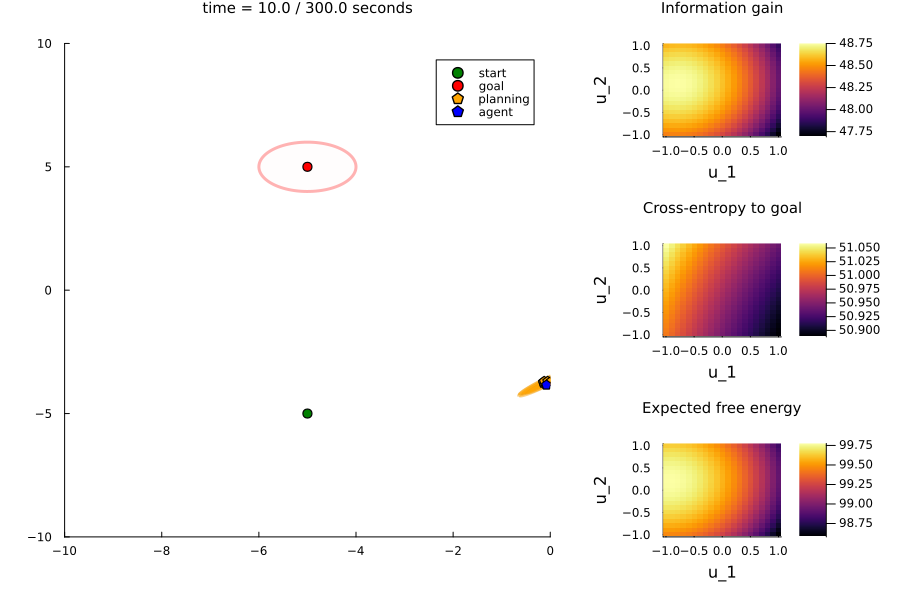

In [23]:
    tk = 100

    lay = @layout [ a{0.7w} [grid(3,1)] ]
    
    # EFE landscape
    p31 = heatmap(ur, ur, reshape(MI[:,tk], (Nu,Nu)), title="Information gain", xlabel="u_1", ylabel="u_2")
    p32 = heatmap(ur, ur, reshape(CE[:,tk], (Nu,Nu)), title="Cross-entropy to goal", xlabel="u_1", ylabel="u_2")
    p33 = heatmap(ur, ur, reshape(Ju[:,tk], (Nu,Nu)), title="Expected free energy", xlabel="u_1", ylabel="u_2")
    
    # Moving bot
    # xl = extrema(y_sim[1,:])
    # yl = extrema(y_sim[2,:])
    xl = (-10,0)
    yl = (-10,10)
    ttime = round(tk*Δt, digits=1)
    Ttime = round(len_trial*Δt, digits=1)
    p1 = plot(title="time = $ttime / $Ttime seconds", xlims=xl, ylims=yl)
    scatter!([z_0[1]], [z_0[2]], label="start", color="green", markersize=5)
    scatter!([mean(agent.goal_prior)[1]], [mean(agent.goal_prior)[2]], label="goal", color="red", markersize=5)
    covellipse!(mean(agent.goal_prior), cov(agent.goal_prior), n_std=1., linewidth=3, fillalpha=0.01, linecolor="red", color="red")
    # scatter!([y_sim[1,tk]], [y_sim[2,tk]], alpha=0.3, label="observations", color="black")
    for kk = 1:len_horizon
        covellipse!(y_pln[1][tk,:,kk], y_pln[2][tk,:,:,kk], linewidth=0, n_std=1, fillalpha=0.5, color="orange")
    end
    scatter!(y_pln[1][tk,1,:], y_pln[1][tk,2,:], marker=:pentagon, markersize=5, color="orange", label="planning")
    scatter!([z_sim[1,tk]], [z_sim[2,tk]], marker=:pentagon, markersize=5, label="agent", color="blue")

    p00 = plot(p1,p31,p32,p33, layout=lay, size=(900,600))

In [ ]:
# surface(Ju[:,10:len_trial], title="EFE(u)", xlabel="time (s)", ylabel="u_t[:]")

In [ ]:
# tk = 10
# heatmap(ur, ur, reshape(Ju[:,tk], (Nu,Nu)), title="Ju(u_1, u_2) at t=$tk", xlabel="u_t1", ylabel="u_t2")

In [ ]:
# surface(MI[:,10:len_trial], title="MI(u)", xlabel="time (s)", ylabel="u_t[:]")

In [ ]:
# tk = 10
# heatmap(ur, ur, reshape(MI[:,tk], (Nu,Nu)), title="MI(u_1, u_2) at t=$tk", xlabel="u_t1", ylabel="u_t2")

In [ ]:
# surface(CE[:,10:len_trial], title="CE(u)", xlabel="time (s)", ylabel="u_t[:]")

In [ ]:
# tk = 10
# heatmap(ur, ur, reshape(CE[:,tk], (Nu,Nu)), title="CE(u_1, u_2) at t=$tk", xlabel="u_t1", ylabel="u_t2")

In [ ]:
# anim = @animate for tk in 2:len_trial

#     p31 = heatmap(ur, ur, reshape(MI[:,tk], (Nu,Nu)), title="MI, t=$tk", xlabel="u_t1", ylabel="u_t2")
#     p32 = heatmap(ur, ur, reshape(CE[:,tk], (Nu,Nu)), title="CE, t=$tk", xlabel="u_t1", ylabel="u_t2")
#     p33 = heatmap(ur, ur, reshape(Ju[:,tk], (Nu,Nu)), title="Ju, t=$tk", xlabel="u_t1", ylabel="u_t2")
#     plot(p31,p32,p33, layout=(1,3), size=(1200,300))

# end
# gif(anim, fps=30)